# Visualization of learning effects - Activations
- for convolutional and max_pooling layers

In [1]:
import numpy as np
import pandas as pd
import keras
from keras import models
import matplotlib.pyplot as plt
import my_functions
import warnings
import tensorflow as tf
warnings.filterwarnings('ignore')
tf.logging.set_verbosity(tf.logging.ERROR)

Using TensorFlow backend.
/home/artur/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/artur/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/artur/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/artur/.local/lib/python3.6/site-packages/tensorflow/python/fra

###  1. Choice of the one image from original, not generated by augmentation ones:

In [2]:
%%bash
ls ./Used_data

TEST_IMAGES.npy
TEST_LABELS.npy
TRAIN_IMAGES.npy
TRAIN_LABELS.npy
TRAIN_X_EXTD.npy
TRAIN_Y_EXTD.npy
VALID_IMAGES.npy
VALID_LABELS.npy


In [3]:
TRAIN_X = np.load('./Used_data/TRAIN_IMAGES.npy')
TRAIN_X.shape

(1600, 96, 96, 3)

In [4]:
img_tensor = TRAIN_X[14:15]
img_tensor.shape

(1, 96, 96, 3)

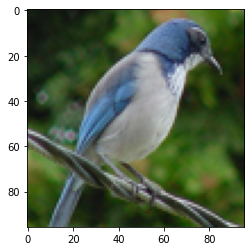

In [5]:
plt.imshow(img_tensor[0])
plt.show()

###  2. Choice of the models:

In [6]:
pd.DataFrame(my_functions.results_preview()).head(15)

,model_name,model_description,notebook,dataset_size,batch_size,epochs,optimizer,acc,remarks
0,model_0_0-100-150-sgd-trd,32-64-128-256-512,Module_1,1600,100,150,sgd,0.924,100-overfit
1,model_0_0-100-150-adlt-trd,32-64-128-256-512,Module_1,1600,100,150,adadelta,0.918,20-overfit
2,model_0_0-100-120-rmsp-trd,32-64-128-256-512,Module_1,1600,100,120,rmsprop,0.924,15-overfit
3,model_0_0-100-100-RMSp-trd,32-64-128-256-512,Module_1,1600,100,100,RMSprop(lr=1e-4),0.932,20-overfit
4,model_0_0-100-100-sgd-trd,32-64-128-256-512,Module_1,1600,100,100,sgd,0.904,no overfit
5,model_0_0-30-100-sgd-trd,32-64-128-256-512,Module_1,1600,30,100,sgd,0.918,40-overfit
6,model_0_0-15-40-sgd-trd,32-64-128-256-512,Module_1,1600,15,40,sgd,0.920,15-overfit
7,model_0_0-15-25-RMSp-trd,32-64-128-256-512,Module_1,1600,15,25,RMSprop(lr=1e-4),0.882,6-overfit
8,model_0_0-15-15-rmsp-trd,32-64-128-256-512,Module_1,1600,15,15,rmsprop,0.926,4-overfit
9,model_0_8-100-150-sgd-trd,32-64-128-256-512,Module_3,8000,100,150,sgd,0.522,80-overfit


In [7]:
model_0 = keras.models.load_model('./Models/model_0.h5')
model = keras.models.load_model('./Models/model_0_8-30-8-adlt-trd.h5') # No. 14

# both above are the same model but the first one before  training, the second one after training

model.summary()

Model: "model_0"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 94, 94, 32)        896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 47, 47, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 20, 20, 128)       73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 10, 10, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 8, 8, 256)         2951

In [8]:
# number of all layers
len(model.layers)

13

In [9]:
layers_range = 10
activations = my_functions.activations(model, layers_range, img_tensor)

In [10]:
len(activations)

10

In [11]:
len(activations[0])

1

In [12]:
activations[0].shape

(1, 94, 94, 32)

### 3. Overview of all activation channels for convolutional  and max_pooling layers:

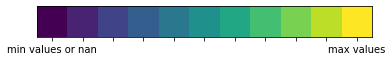

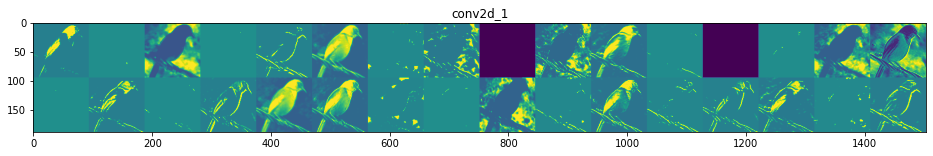

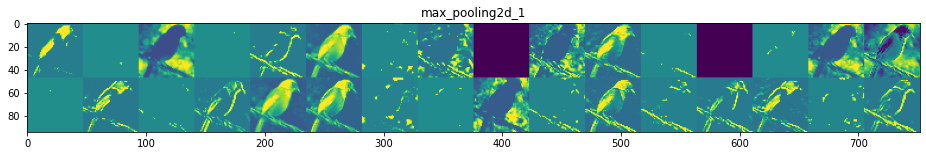

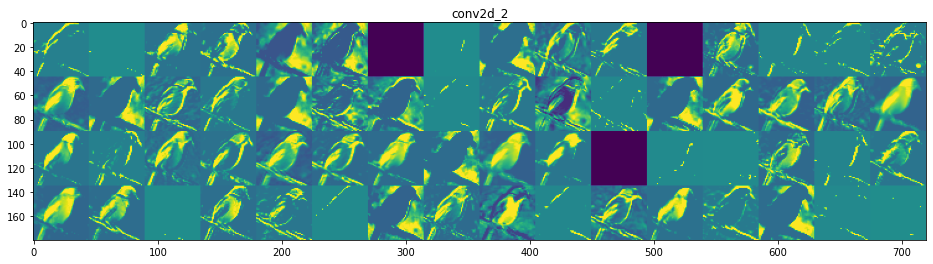

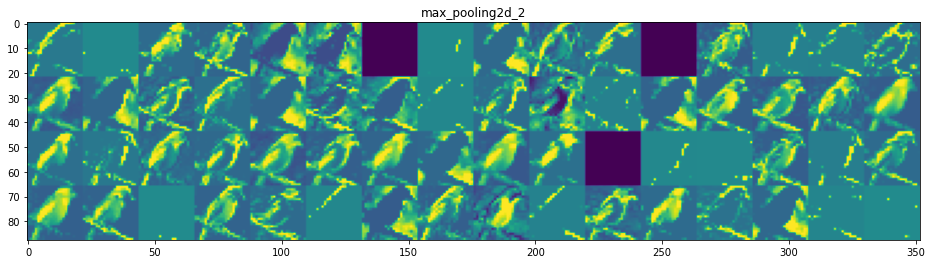

...

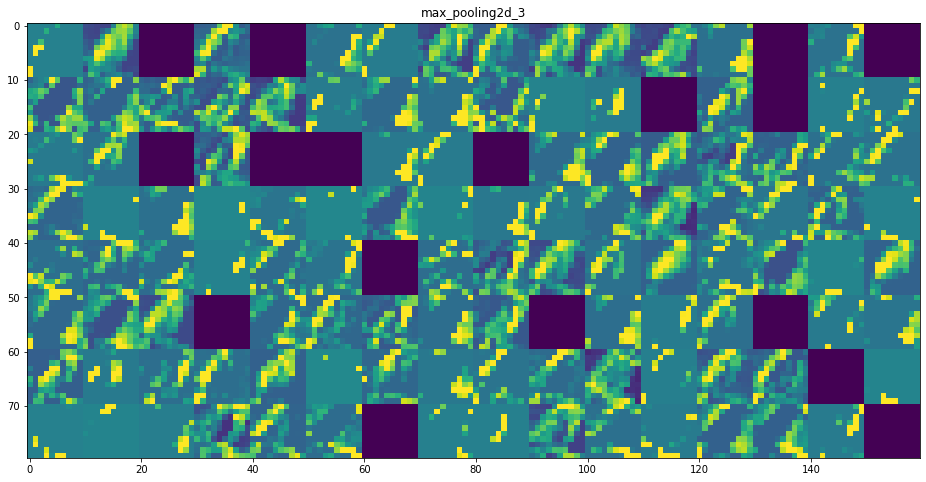

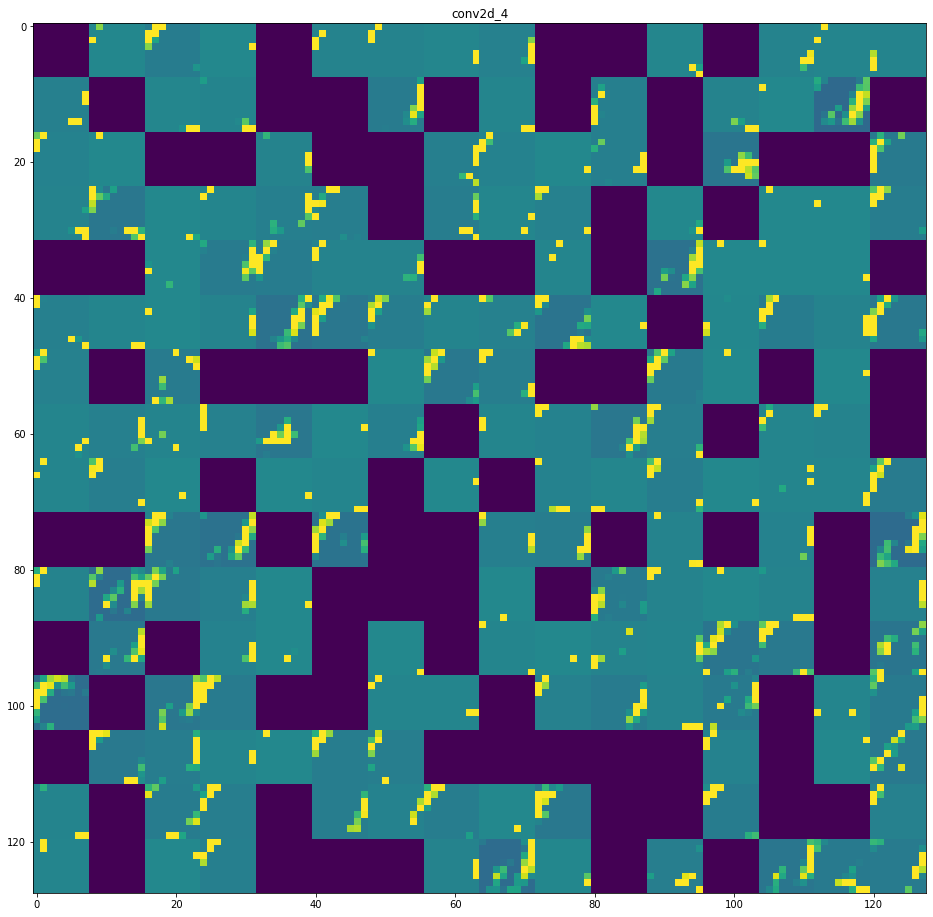

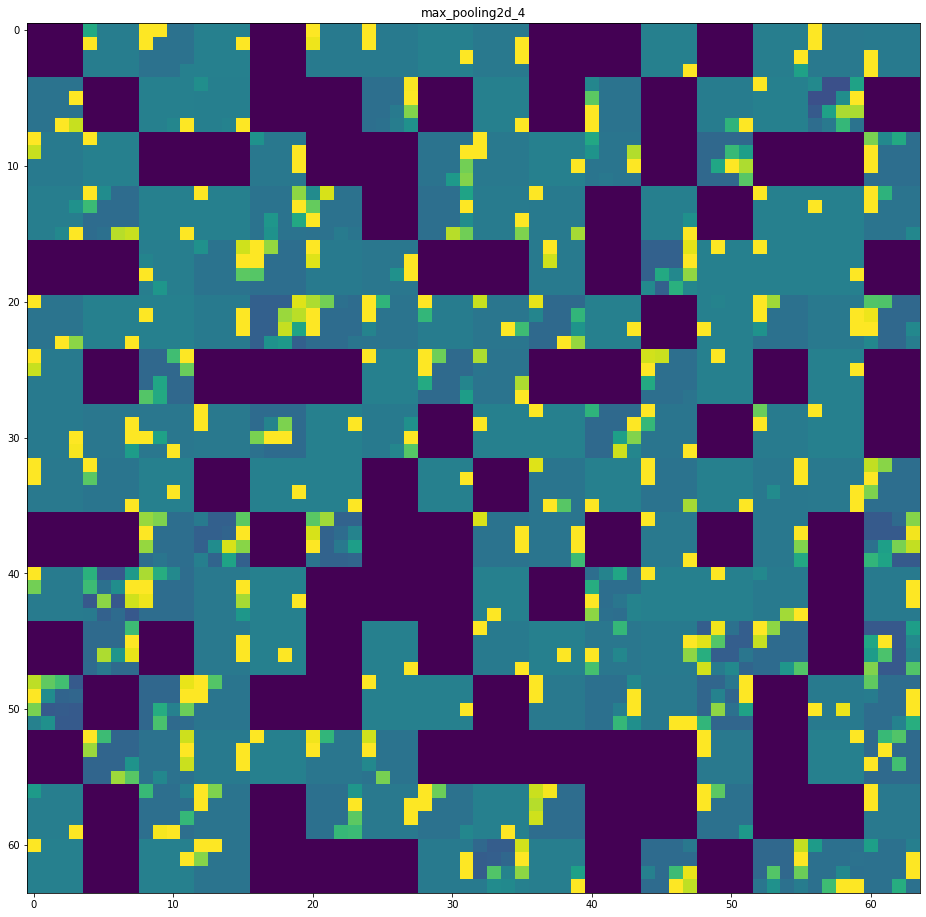

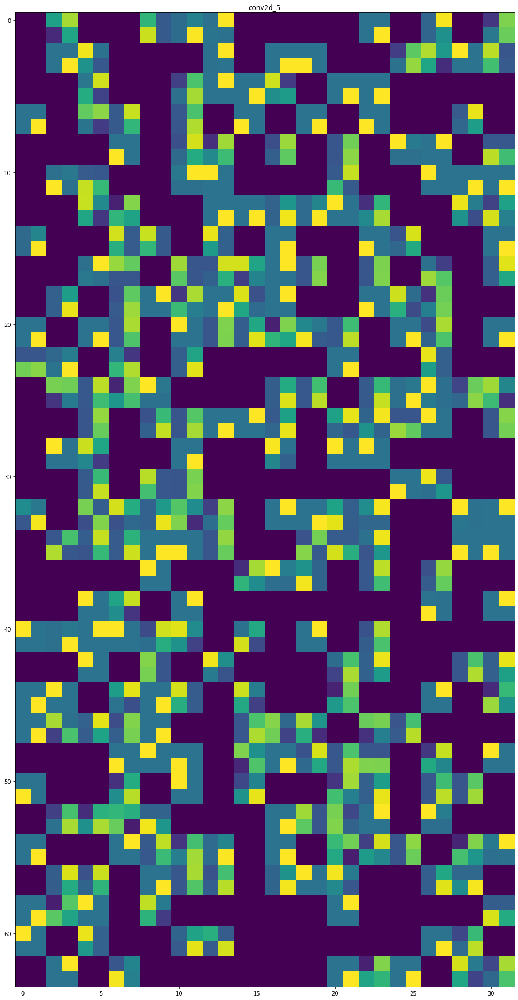

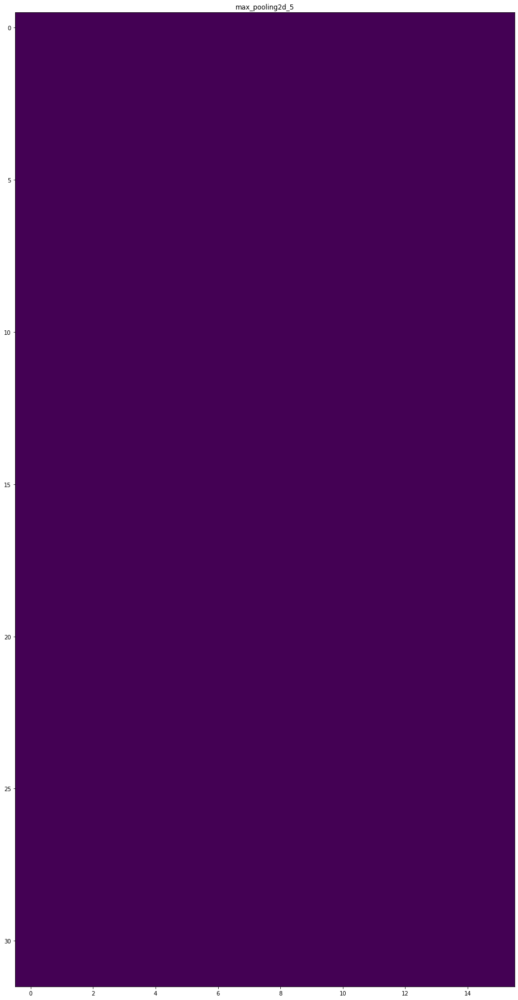

In [13]:
layers_range = 10  # all convolutional and max_pooling layers
my_functions.activation_channels(model, layers_range, img_tensor)

******************************************************************************

### 4. An example of activating the first convolutional layer generated on the basis of a selected photo. 
(94x94 feature map consisting of 32 channels)

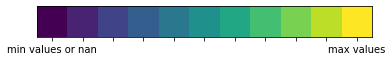

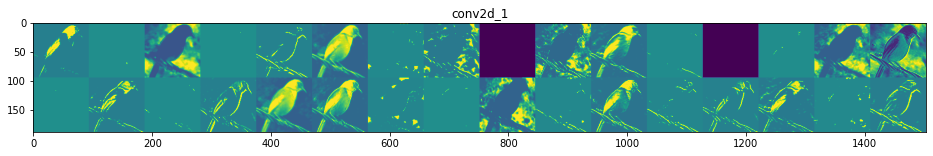

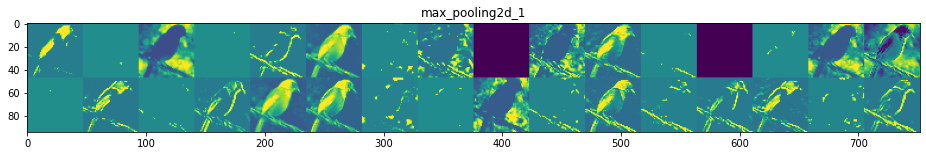

In [14]:
layers_range = 2  # has to be as > 1, convolutional and max_pooling layers
my_functions.activation_channels(model, layers_range, img_tensor)

#### 4.1 Not trained model 'model_0' vs. model with the low validation accuracy - No. 7

_________________________________________________________________________________________________________

Layer 0 activations,  channel  0

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 1)

Max. value of activation after training:    50.69575
It's coordinates on the picture as (y, x):  (35, 67)


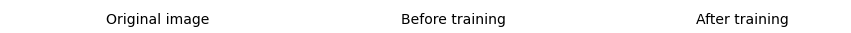

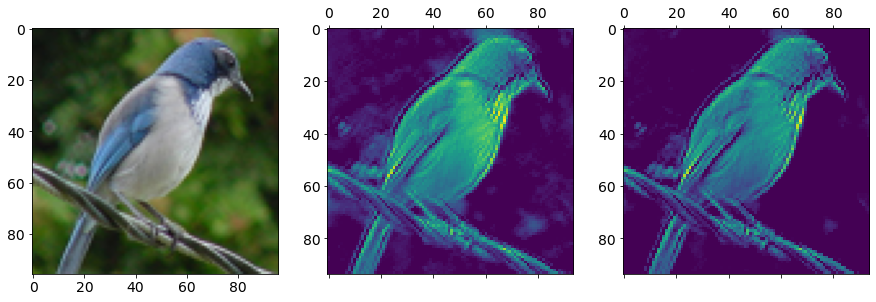

_________________________________________________________________________________________________________

Layer 0 activations,  channel  1

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 4)

Max. value of activation after training:    36.318256
It's coordinates on the picture as (y, x):  (81, 13)


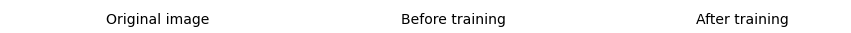

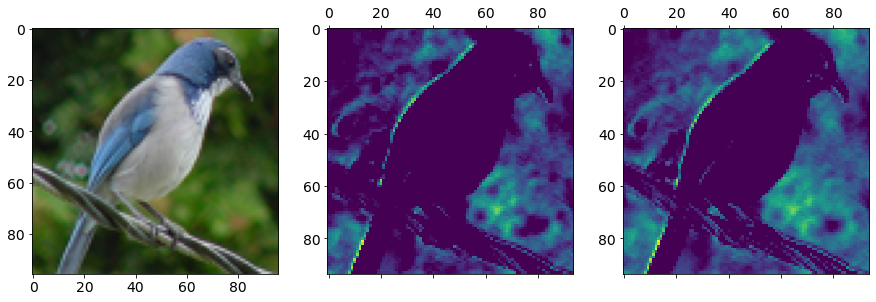

_________________________________________________________________________________________________________

Layer 0 activations,  channel  2

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (3, 63)

Max. value of activation after training:    40.675102
It's coordinates on the picture as (y, x):  (0, 56)


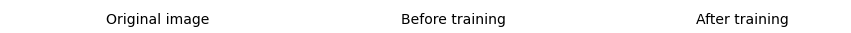

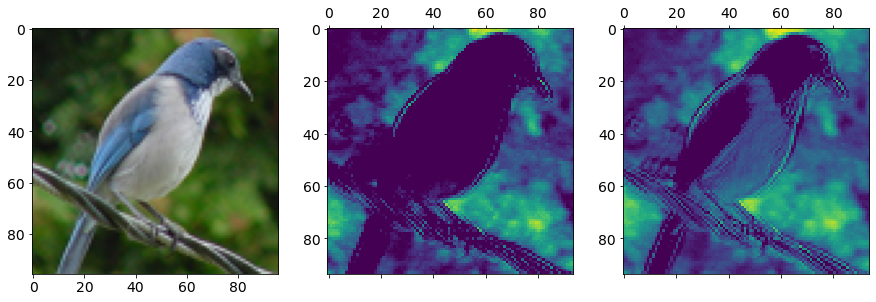

_________________________________________________________________________________________________________

Layer 0 activations,  channel  3

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    14.010116
It's coordinates on the picture as (y, x):  (53, 27)


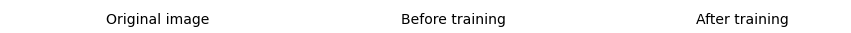

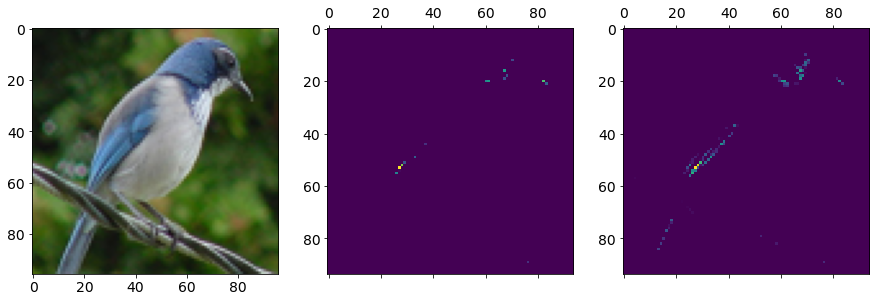

_________________________________________________________________________________________________________

Layer 0 activations,  channel  4

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 10)

Max. value of activation after training:    45.515354
It's coordinates on the picture as (y, x):  (25, 70)


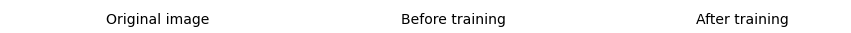

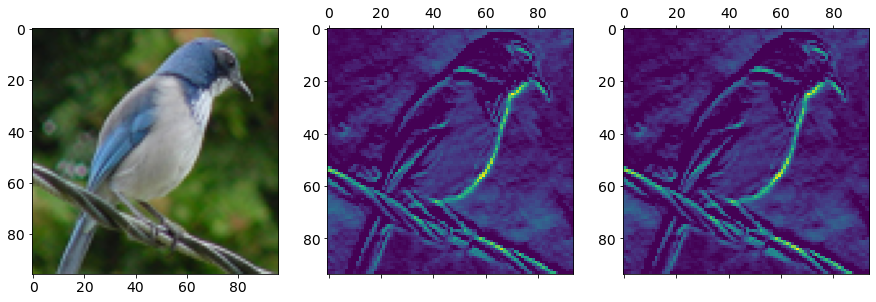

_________________________________________________________________________________________________________

Layer 0 activations,  channel  5

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 78)

Max. value of activation after training:    113.777176
It's coordinates on the picture as (y, x):  (85, 69)


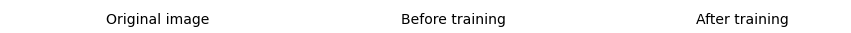

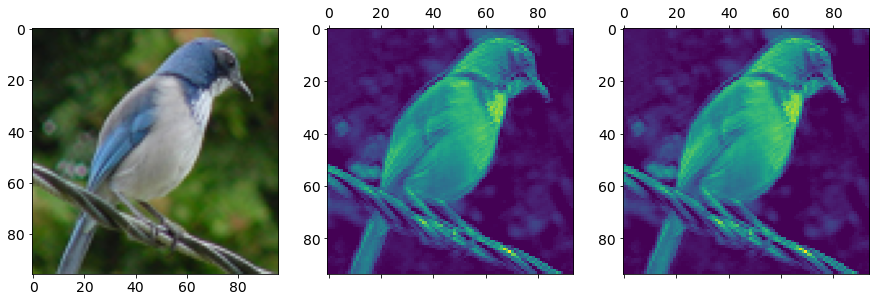

_________________________________________________________________________________________________________

Layer 0 activations,  channel  6

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    2.026805
It's coordinates on the picture as (y, x):  (32, 69)


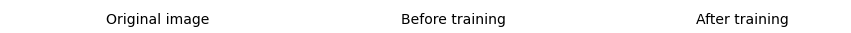

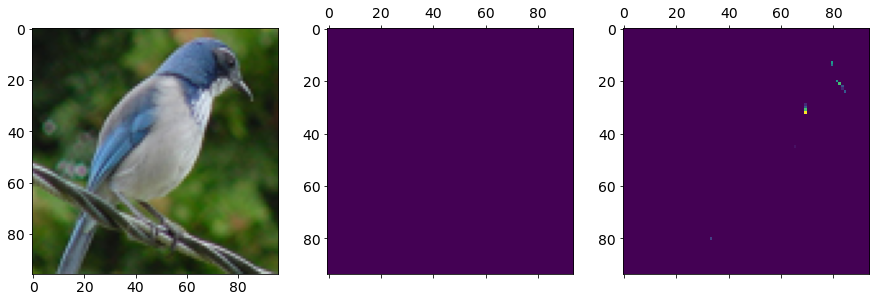

_________________________________________________________________________________________________________

Layer 0 activations,  channel  7

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    35.345543
It's coordinates on the picture as (y, x):  (22, 82)


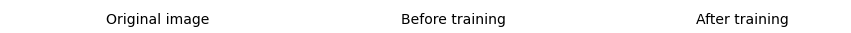

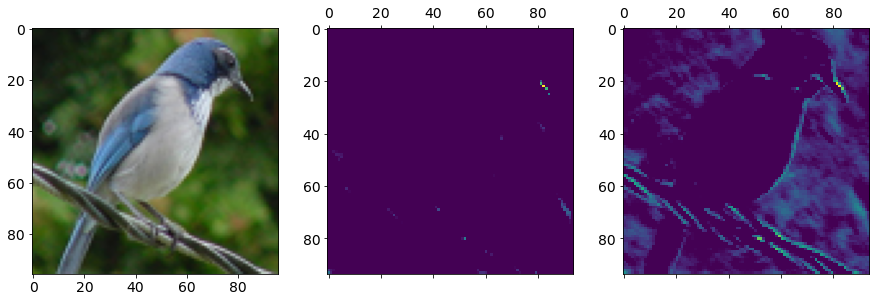

_________________________________________________________________________________________________________

Layer 0 activations,  channel  8

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 21)

Max. value of activation after training:    35.46862
It's coordinates on the picture as (y, x):  (59, 20)


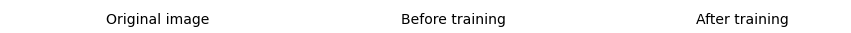

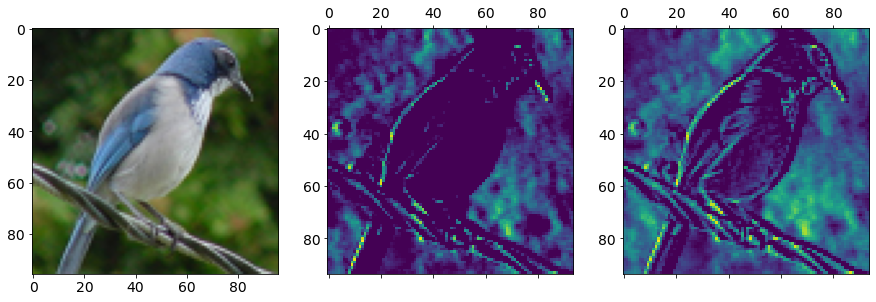

_________________________________________________________________________________________________________

Layer 0 activations,  channel  9

Min. value of activation after training:    11.568603
It's coordinates on the picture as (y, x):  (6, 0)

Max. value of activation after training:    149.67448
It's coordinates on the picture as (y, x):  (28, 67)


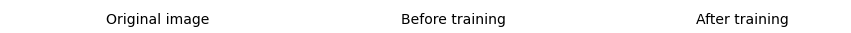

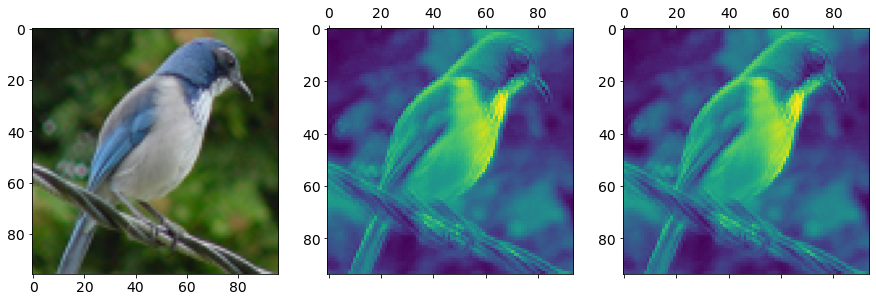

_________________________________________________________________________________________________________

Layer 0 activations,  channel  10

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 54)

Max. value of activation after training:    70.84734
It's coordinates on the picture as (y, x):  (82, 67)


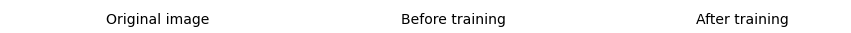

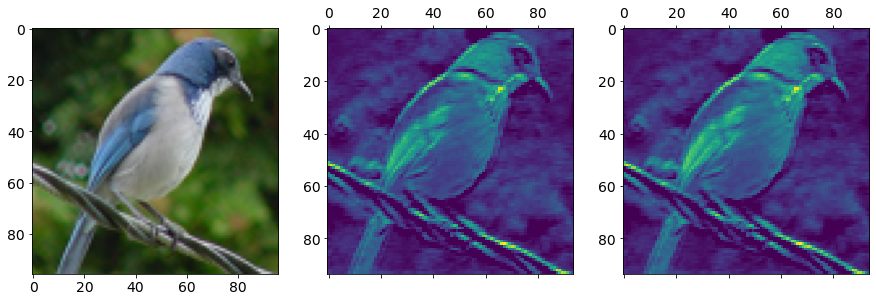

_________________________________________________________________________________________________________

Layer 0 activations,  channel  11

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 9)

Max. value of activation after training:    61.036594
It's coordinates on the picture as (y, x):  (92, 88)


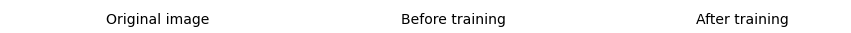

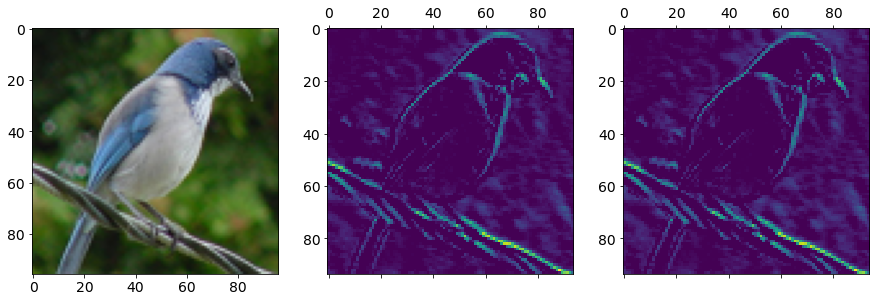

_________________________________________________________________________________________________________

Layer 0 activations,  channel  12

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    20.184761
It's coordinates on the picture as (y, x):  (55, 2)


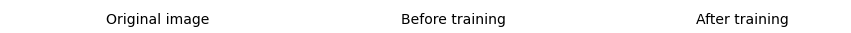

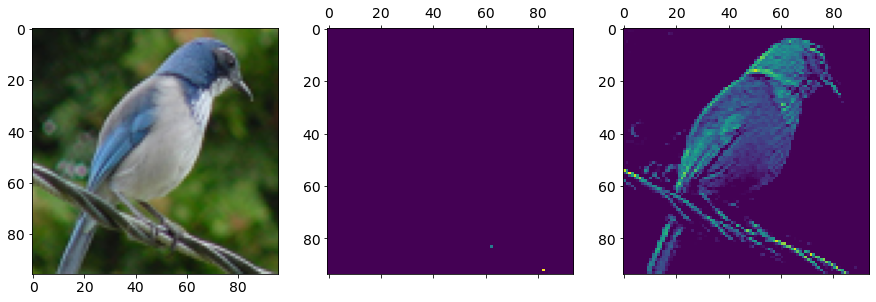

_________________________________________________________________________________________________________

Layer 0 activations,  channel  13

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    53.810596
It's coordinates on the picture as (y, x):  (53, 25)


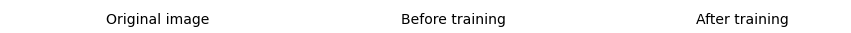

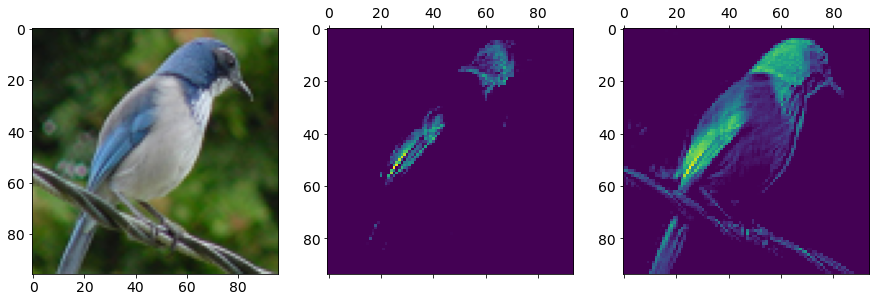

_________________________________________________________________________________________________________

Layer 0 activations,  channel  14

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (4, 63)

Max. value of activation after training:    45.94906
It's coordinates on the picture as (y, x):  (2, 66)


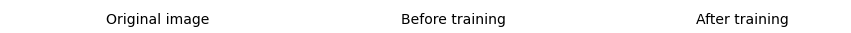

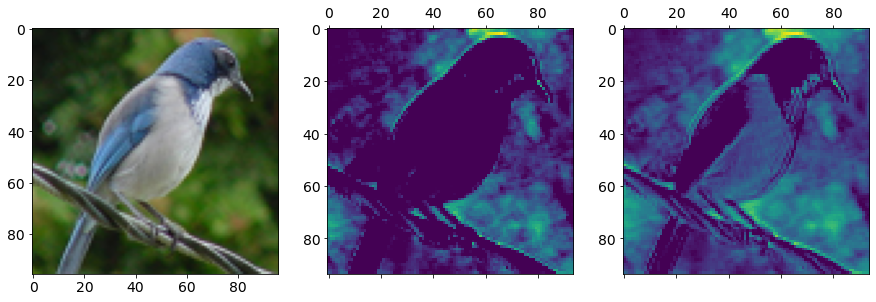

_________________________________________________________________________________________________________

Layer 0 activations,  channel  15

Min. value of activation after training:    8.9481535
It's coordinates on the picture as (y, x):  (45, 2)

Max. value of activation after training:    132.33142
It's coordinates on the picture as (y, x):  (26, 66)


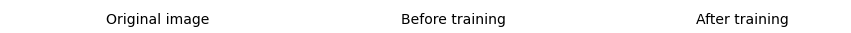

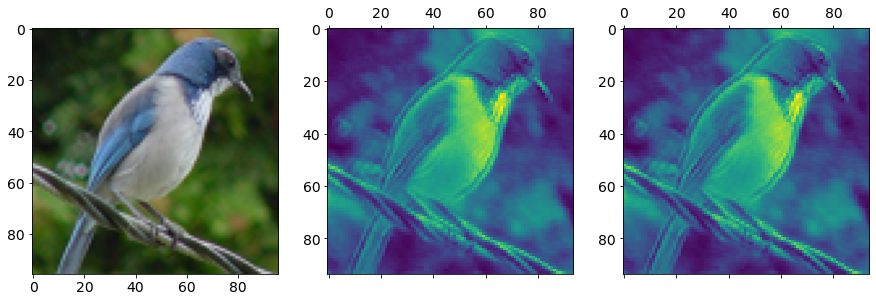

_________________________________________________________________________________________________________

Layer 0 activations,  channel  16

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    16.006231
It's coordinates on the picture as (y, x):  (84, 70)


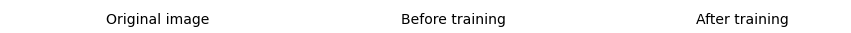

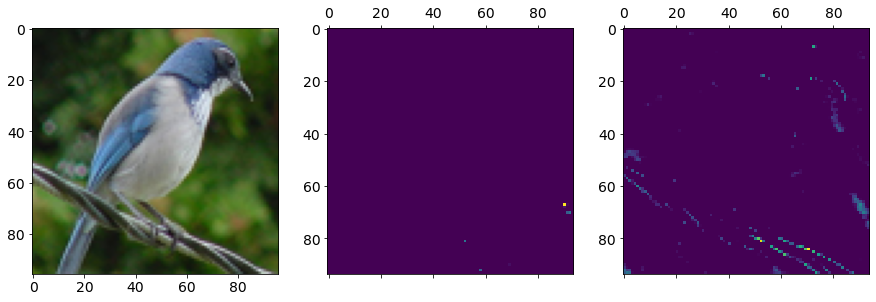

_________________________________________________________________________________________________________

Layer 0 activations,  channel  17

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    49.636837
It's coordinates on the picture as (y, x):  (23, 66)


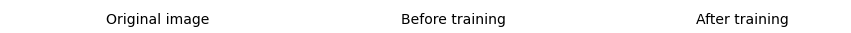

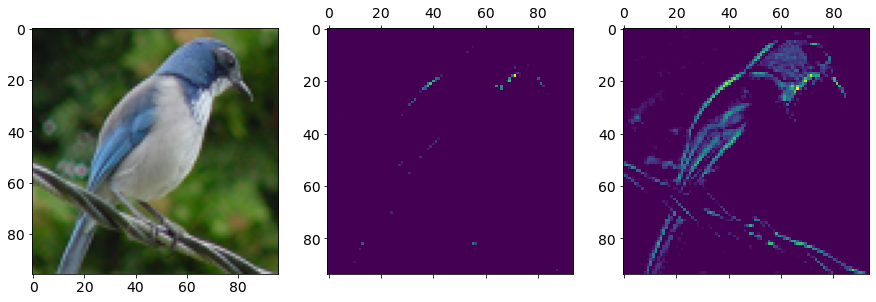

_________________________________________________________________________________________________________

Layer 0 activations,  channel  18

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    55.476738
It's coordinates on the picture as (y, x):  (79, 52)


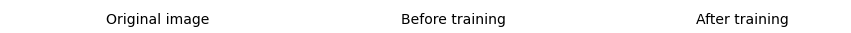

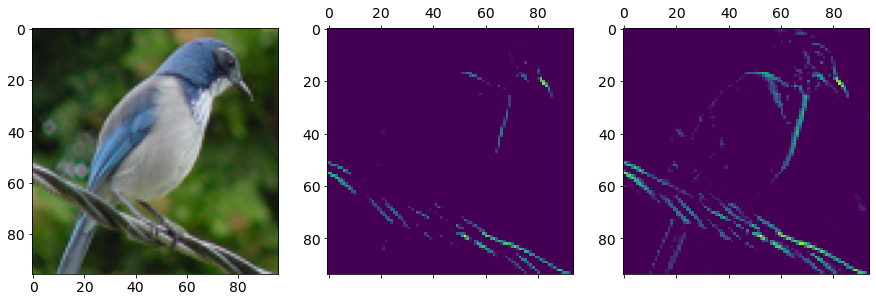

_________________________________________________________________________________________________________

Layer 0 activations,  channel  19

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (4, 38)

Max. value of activation after training:    109.51795
It's coordinates on the picture as (y, x):  (32, 68)


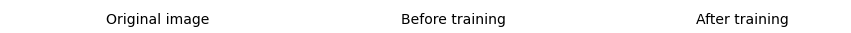

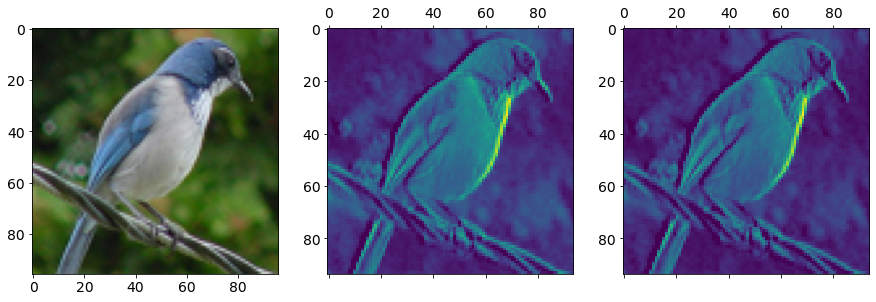

_________________________________________________________________________________________________________

Layer 0 activations,  channel  20

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 24)

Max. value of activation after training:    48.171436
It's coordinates on the picture as (y, x):  (53, 25)


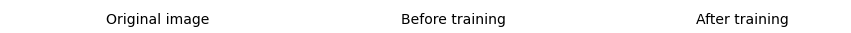

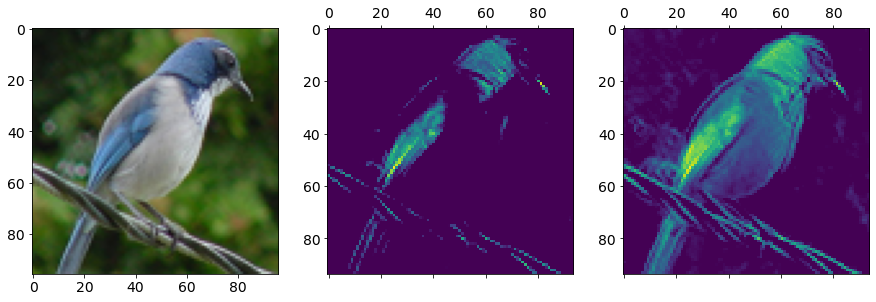

_________________________________________________________________________________________________________

Layer 0 activations,  channel  21

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (15, 80)

Max. value of activation after training:    72.49506
It's coordinates on the picture as (y, x):  (55, 22)


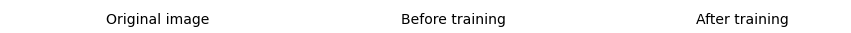

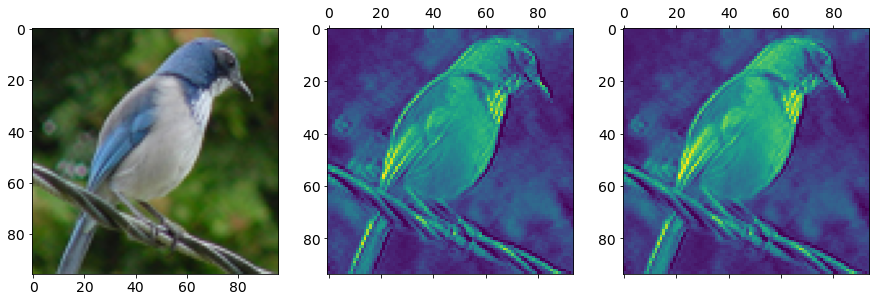

_________________________________________________________________________________________________________

Layer 0 activations,  channel  22

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 27)

Max. value of activation after training:    50.415207
It's coordinates on the picture as (y, x):  (4, 58)


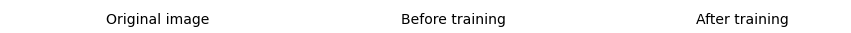

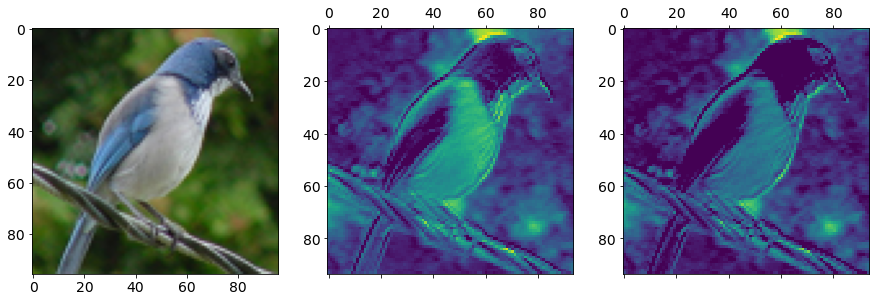

_________________________________________________________________________________________________________

Layer 0 activations,  channel  23

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)


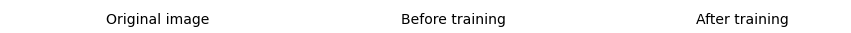

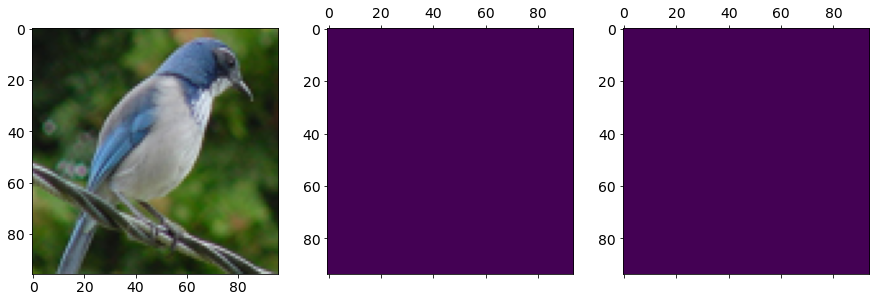

_________________________________________________________________________________________________________

Layer 0 activations,  channel  24

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    21.678095
It's coordinates on the picture as (y, x):  (38, 3)


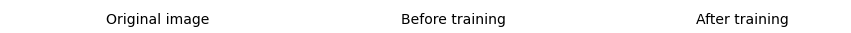

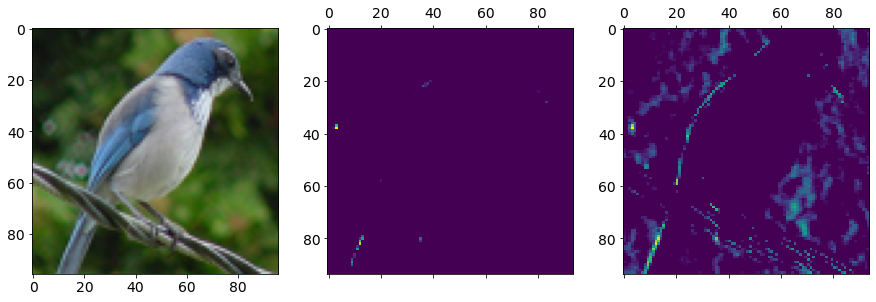

_________________________________________________________________________________________________________

Layer 0 activations,  channel  25

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    37.22402
It's coordinates on the picture as (y, x):  (84, 65)


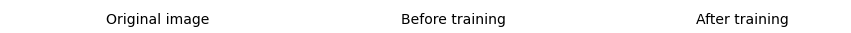

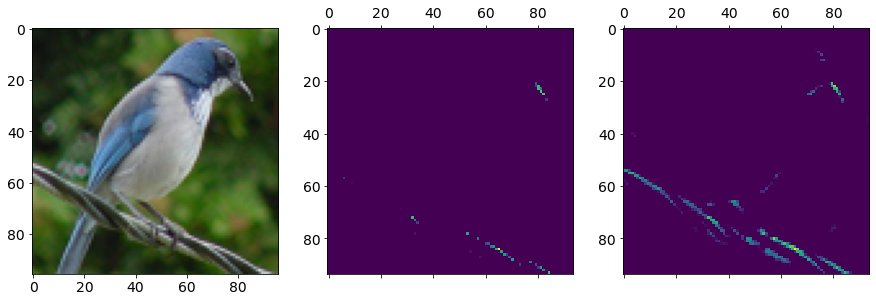

_________________________________________________________________________________________________________

Layer 0 activations,  channel  26

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 1)

Max. value of activation after training:    52.58344
It's coordinates on the picture as (y, x):  (84, 65)


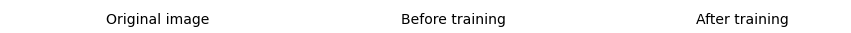

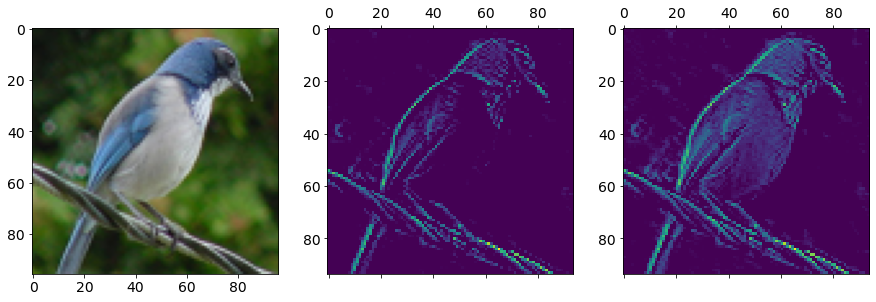

_________________________________________________________________________________________________________

Layer 0 activations,  channel  27

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 18)

Max. value of activation after training:    58.04813
It's coordinates on the picture as (y, x):  (84, 66)


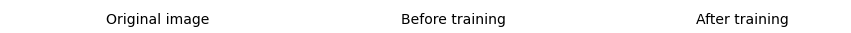

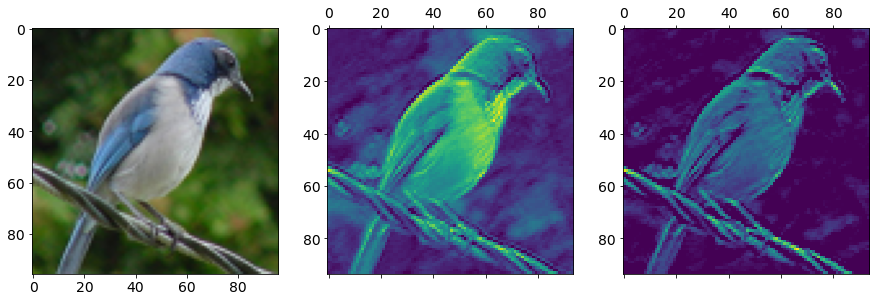

_________________________________________________________________________________________________________

Layer 0 activations,  channel  28

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 16)

Max. value of activation after training:    66.43986
It's coordinates on the picture as (y, x):  (33, 67)


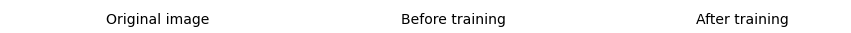

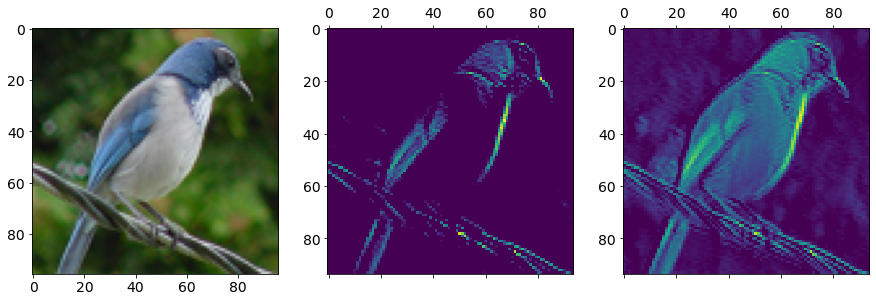

_________________________________________________________________________________________________________

Layer 0 activations,  channel  29

Min. value of activation after training:    6.2066336
It's coordinates on the picture as (y, x):  (44, 2)

Max. value of activation after training:    92.54242
It's coordinates on the picture as (y, x):  (27, 66)


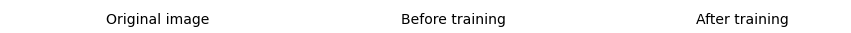

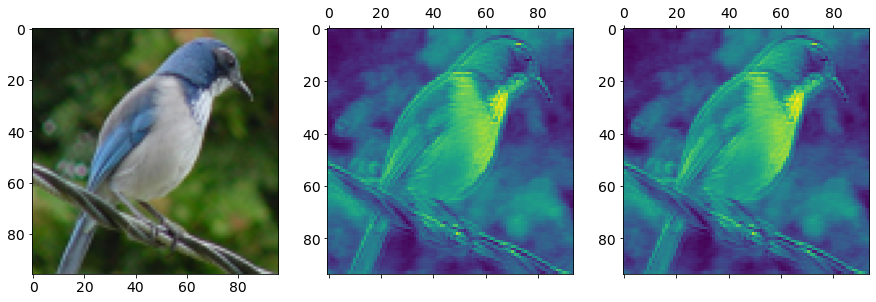

_________________________________________________________________________________________________________

Layer 0 activations,  channel  30

Min. value of activation after training:    2.6413438
It's coordinates on the picture as (y, x):  (93, 59)

Max. value of activation after training:    110.86729
It's coordinates on the picture as (y, x):  (26, 64)


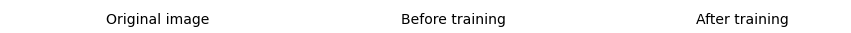

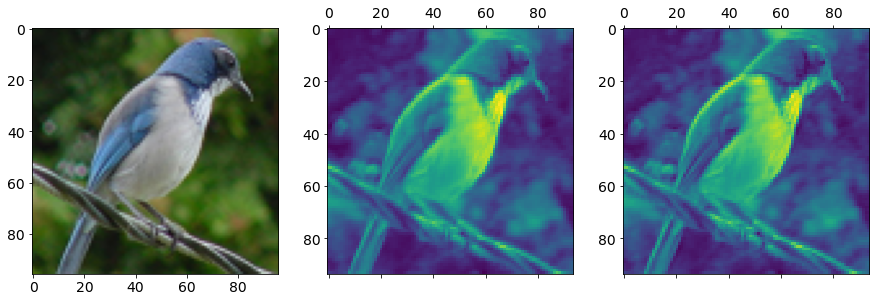

_________________________________________________________________________________________________________


In [15]:
del(model)
model_0 = keras.models.load_model('./Models/model_0.h5')
model = keras.models.load_model('./Models/model_0_0-15-25-RMSp-trd.h5') # No.7

layers_range = 10
layer = 0
chanels_range = [0, 31]  # all chanels

my_functions.activations_preview(layer, model_0, model, layers_range, img_tensor, chanels_range)

#### 4.2 Not trained model 'model_0' vs. model with higher validation accuracy - No. 14

_________________________________________________________________________________________________________

Layer 0 activations,  channel  0

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    39.7788
It's coordinates on the picture as (y, x):  (53, 25)


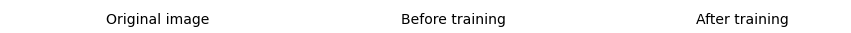

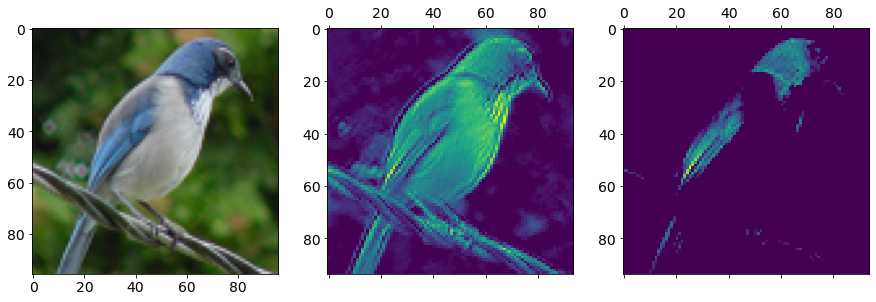

_________________________________________________________________________________________________________

Layer 0 activations,  channel  1

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    2.285162
It's coordinates on the picture as (y, x):  (69, 64)


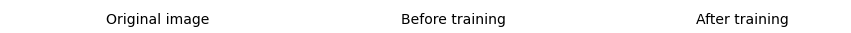

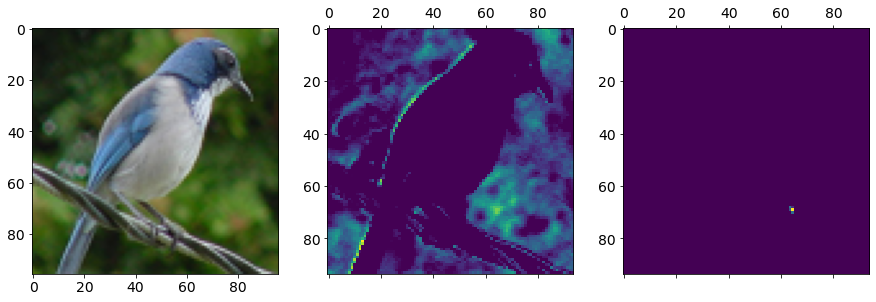

_________________________________________________________________________________________________________

Layer 0 activations,  channel  2

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 16)

Max. value of activation after training:    60.868176
It's coordinates on the picture as (y, x):  (0, 56)


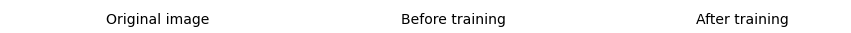

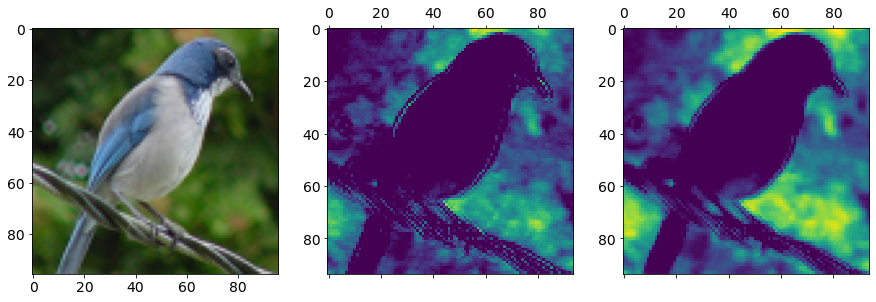

_________________________________________________________________________________________________________

Layer 0 activations,  channel  3

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    0.75711805
It's coordinates on the picture as (y, x):  (16, 67)


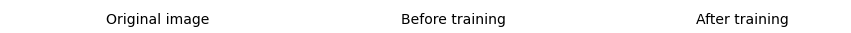

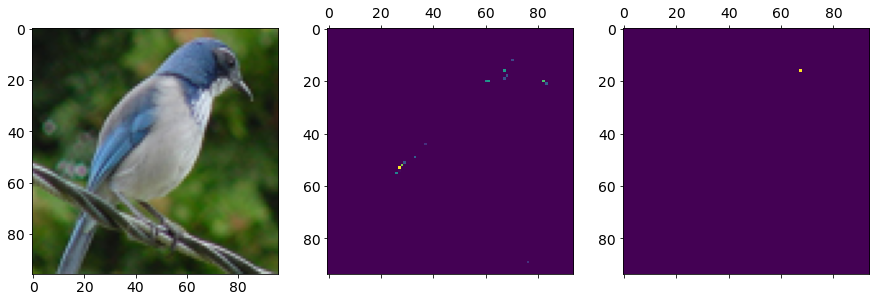

_________________________________________________________________________________________________________

Layer 0 activations,  channel  4

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    45.563564
It's coordinates on the picture as (y, x):  (84, 66)


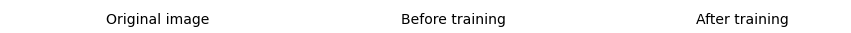

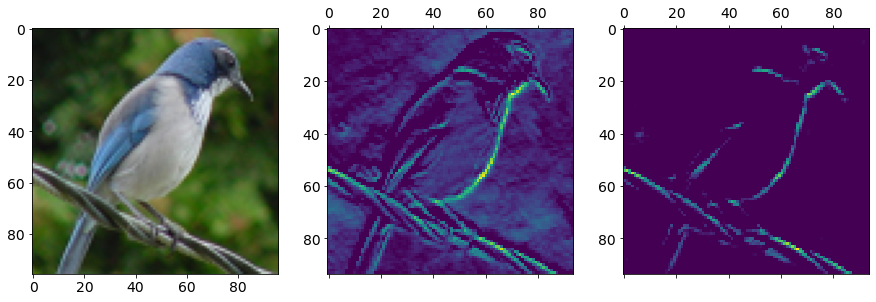

_________________________________________________________________________________________________________

Layer 0 activations,  channel  5

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 26)

Max. value of activation after training:    154.82513
It's coordinates on the picture as (y, x):  (49, 25)


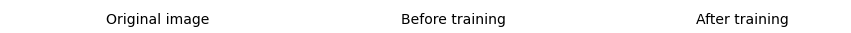

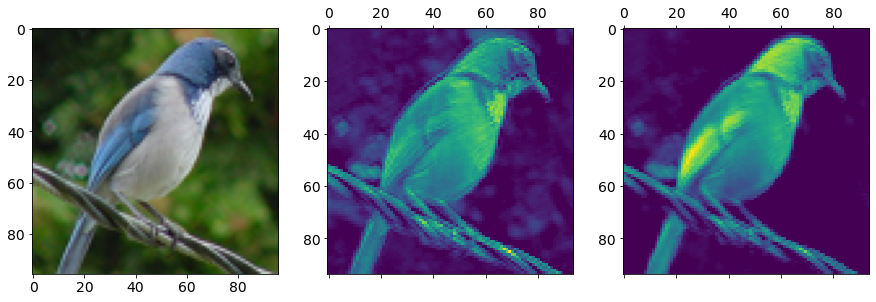

_________________________________________________________________________________________________________

Layer 0 activations,  channel  6

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    10.010829
It's coordinates on the picture as (y, x):  (76, 80)


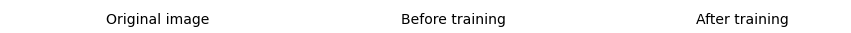

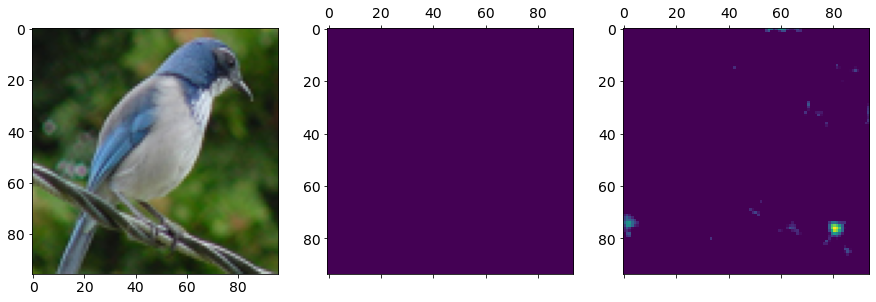

_________________________________________________________________________________________________________

Layer 0 activations,  channel  7

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    26.662563
It's coordinates on the picture as (y, x):  (79, 59)


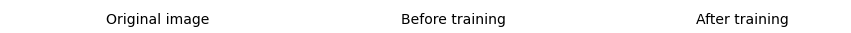

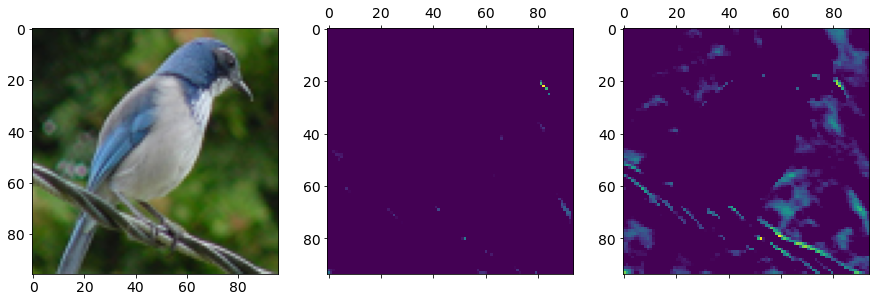

_________________________________________________________________________________________________________

Layer 0 activations,  channel  8

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)


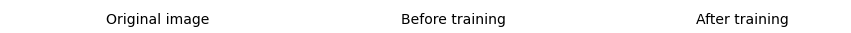

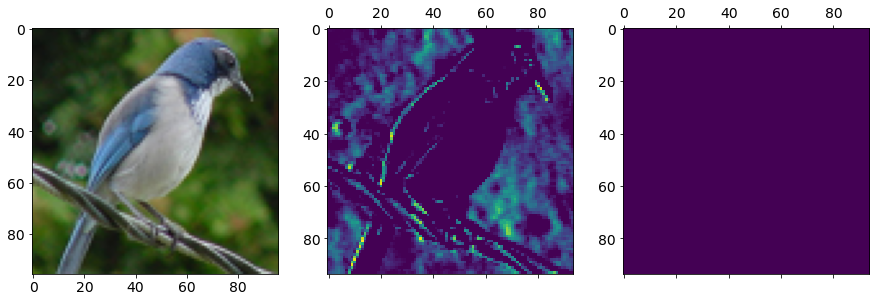

_________________________________________________________________________________________________________

Layer 0 activations,  channel  9

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    20.534735
It's coordinates on the picture as (y, x):  (84, 12)


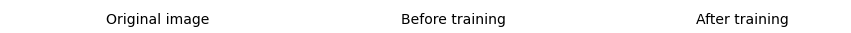

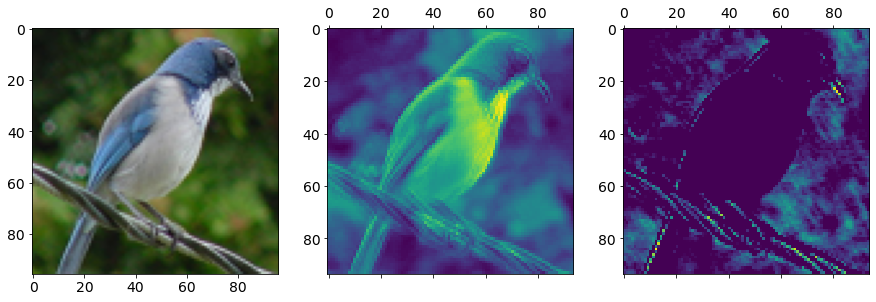

_________________________________________________________________________________________________________

Layer 0 activations,  channel  10

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    112.3544
It's coordinates on the picture as (y, x):  (23, 66)


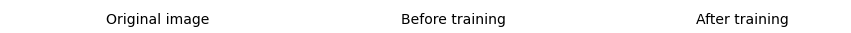

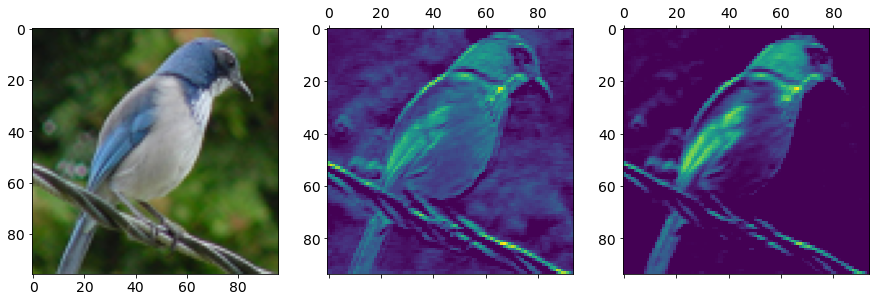

_________________________________________________________________________________________________________

Layer 0 activations,  channel  11

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    32.701107
It's coordinates on the picture as (y, x):  (83, 71)


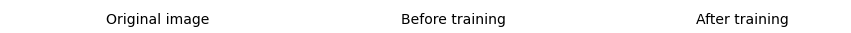

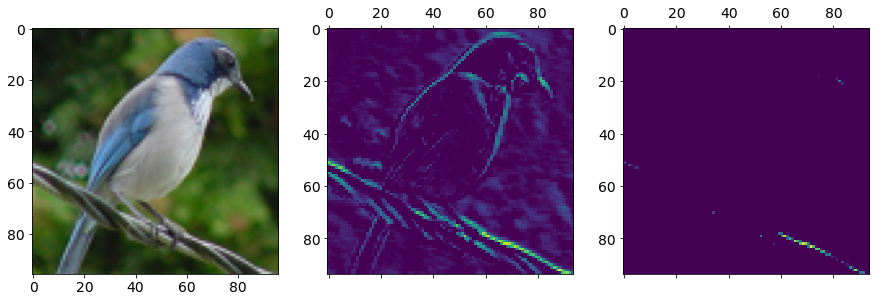

_________________________________________________________________________________________________________

Layer 0 activations,  channel  12

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)


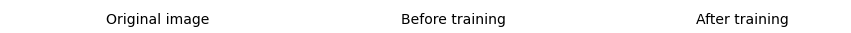

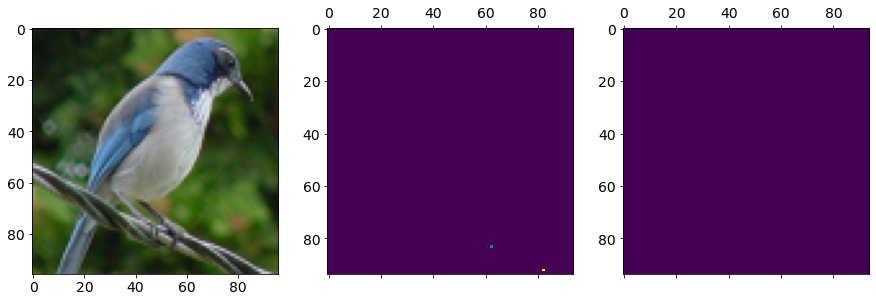

_________________________________________________________________________________________________________

Layer 0 activations,  channel  13

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    5.777927
It's coordinates on the picture as (y, x):  (49, 28)


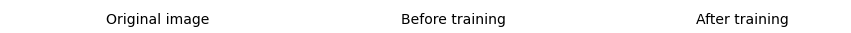

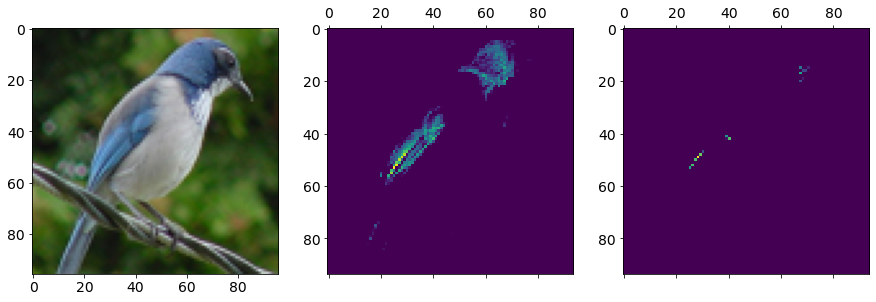

_________________________________________________________________________________________________________

Layer 0 activations,  channel  14

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    41.605274
It's coordinates on the picture as (y, x):  (0, 60)


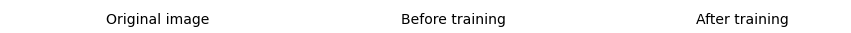

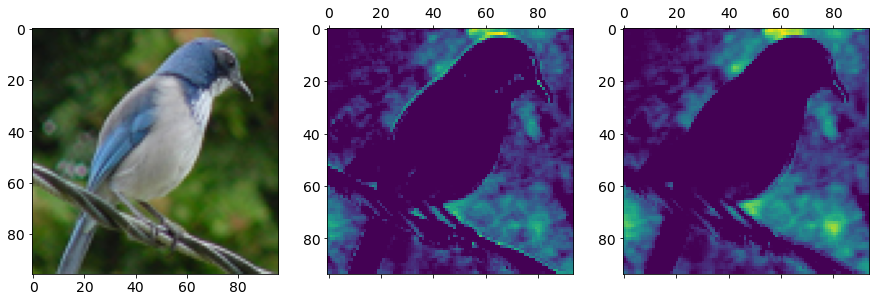

_________________________________________________________________________________________________________

Layer 0 activations,  channel  15

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (4, 62)

Max. value of activation after training:    60.062798
It's coordinates on the picture as (y, x):  (58, 58)


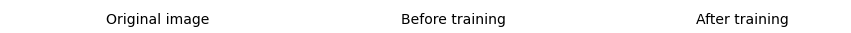

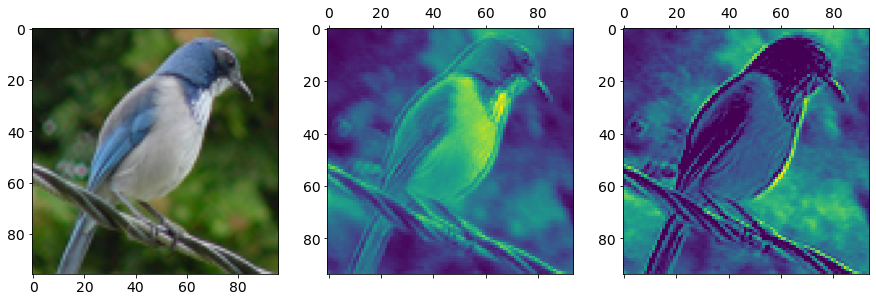

_________________________________________________________________________________________________________

Layer 0 activations,  channel  16

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    1.7633944
It's coordinates on the picture as (y, x):  (22, 38)


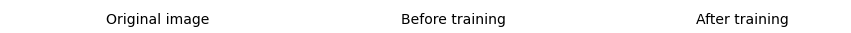

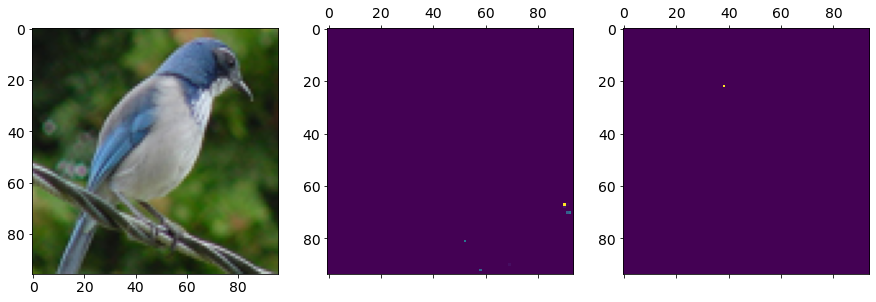

_________________________________________________________________________________________________________

Layer 0 activations,  channel  17

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    85.39696
It's coordinates on the picture as (y, x):  (23, 66)


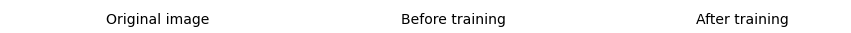

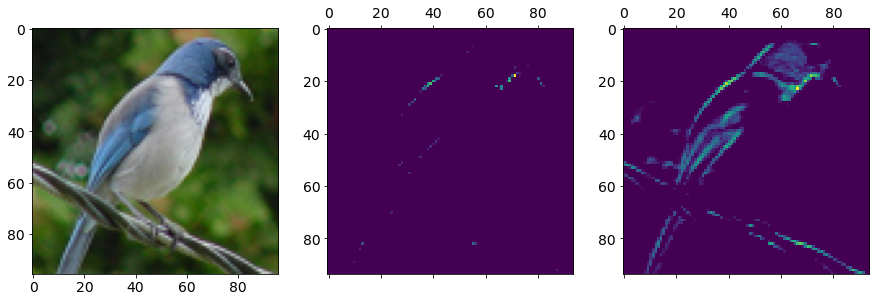

_________________________________________________________________________________________________________

Layer 0 activations,  channel  18

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    25.484226
It's coordinates on the picture as (y, x):  (79, 52)


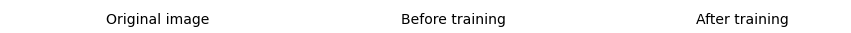

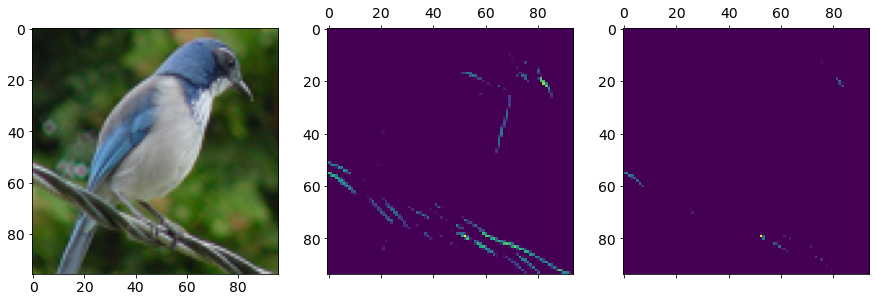

_________________________________________________________________________________________________________

Layer 0 activations,  channel  19

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    90.30833
It's coordinates on the picture as (y, x):  (33, 68)


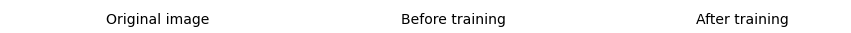

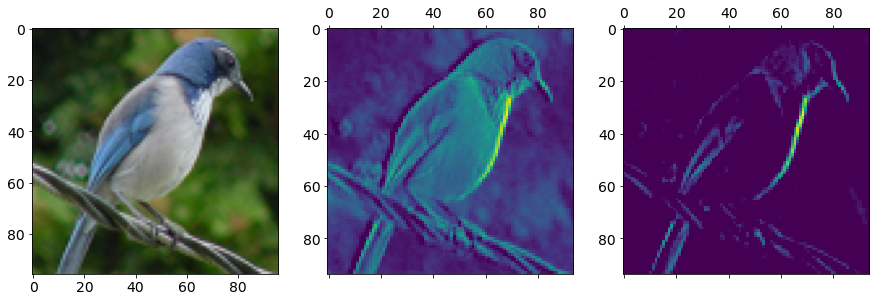

_________________________________________________________________________________________________________

Layer 0 activations,  channel  20

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 44)

Max. value of activation after training:    121.191246
It's coordinates on the picture as (y, x):  (51, 24)


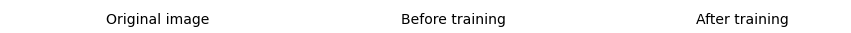

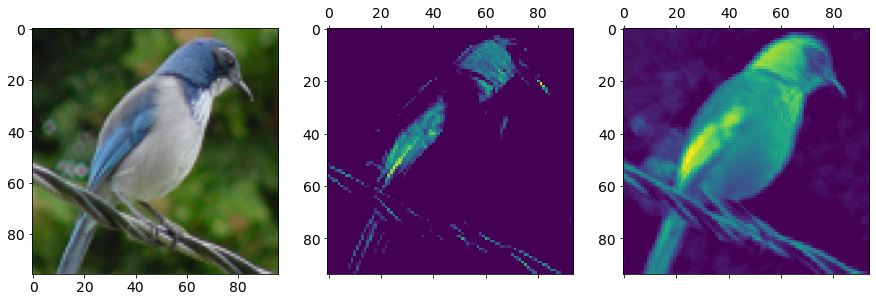

_________________________________________________________________________________________________________

Layer 0 activations,  channel  21

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 12)

Max. value of activation after training:    89.36658
It's coordinates on the picture as (y, x):  (51, 24)


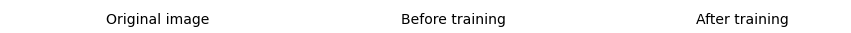

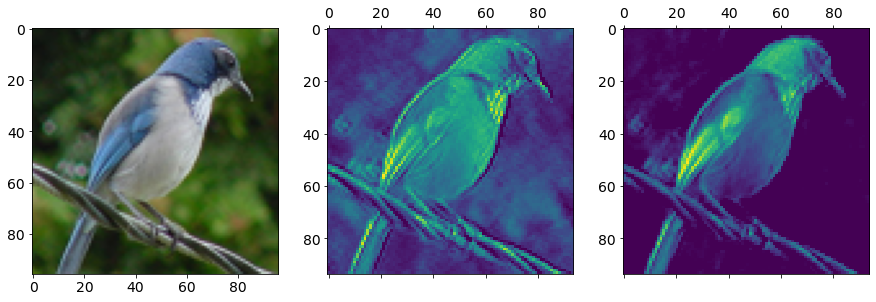

_________________________________________________________________________________________________________

Layer 0 activations,  channel  22

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    31.292898
It's coordinates on the picture as (y, x):  (0, 60)


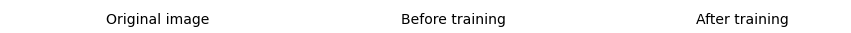

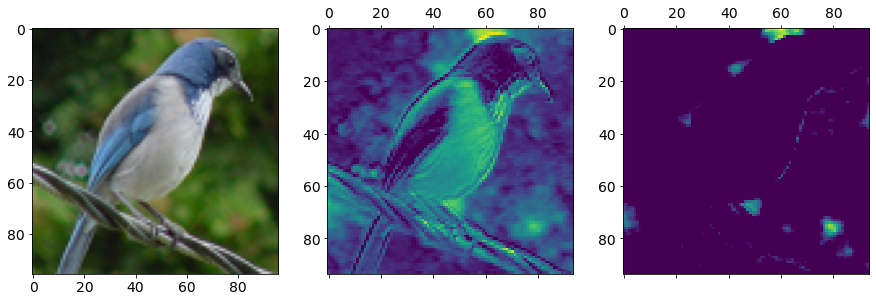

_________________________________________________________________________________________________________

Layer 0 activations,  channel  23

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    25.133902
It's coordinates on the picture as (y, x):  (22, 38)


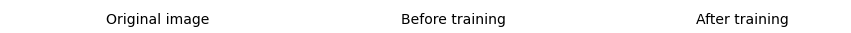

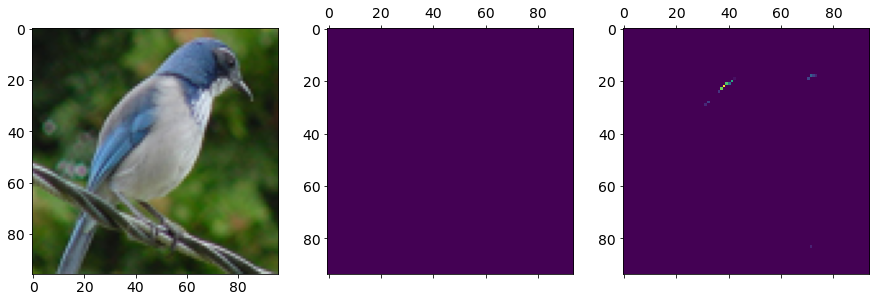

_________________________________________________________________________________________________________

Layer 0 activations,  channel  24

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 1)

Max. value of activation after training:    37.576626
It's coordinates on the picture as (y, x):  (68, 64)


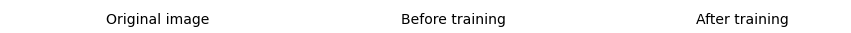

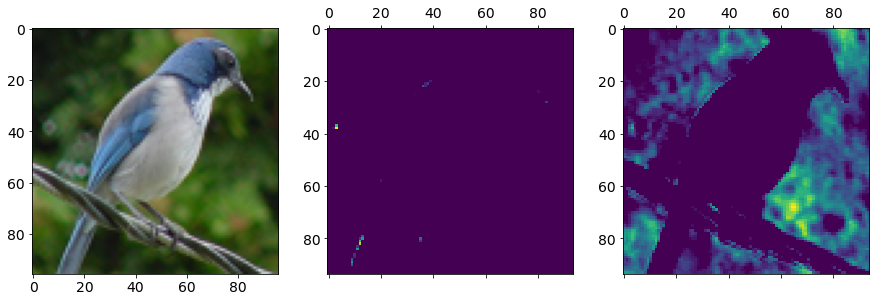

_________________________________________________________________________________________________________

Layer 0 activations,  channel  25

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    28.672709
It's coordinates on the picture as (y, x):  (84, 65)


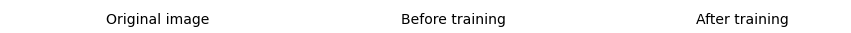

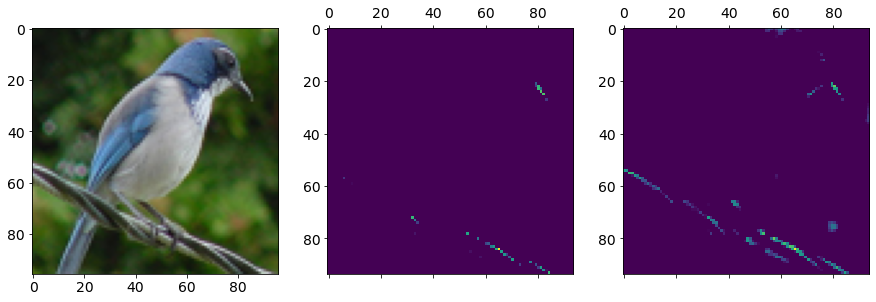

_________________________________________________________________________________________________________

Layer 0 activations,  channel  26

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    78.917946
It's coordinates on the picture as (y, x):  (84, 65)


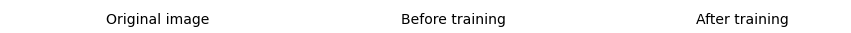

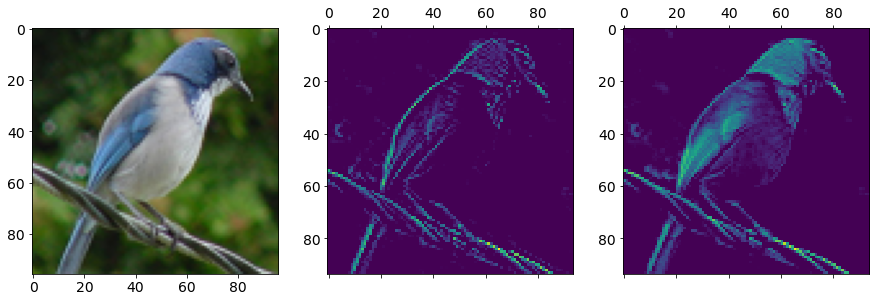

_________________________________________________________________________________________________________

Layer 0 activations,  channel  27

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    43.171146
It's coordinates on the picture as (y, x):  (84, 66)


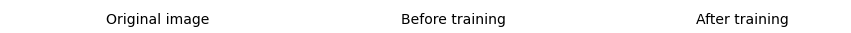

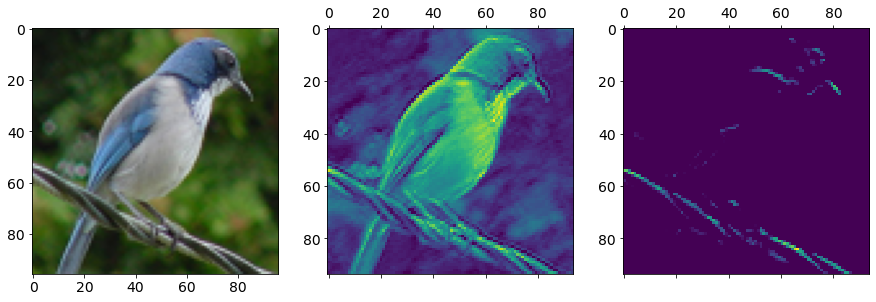

_________________________________________________________________________________________________________

Layer 0 activations,  channel  28

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    60.538235
It's coordinates on the picture as (y, x):  (19, 81)


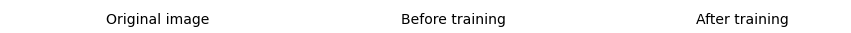

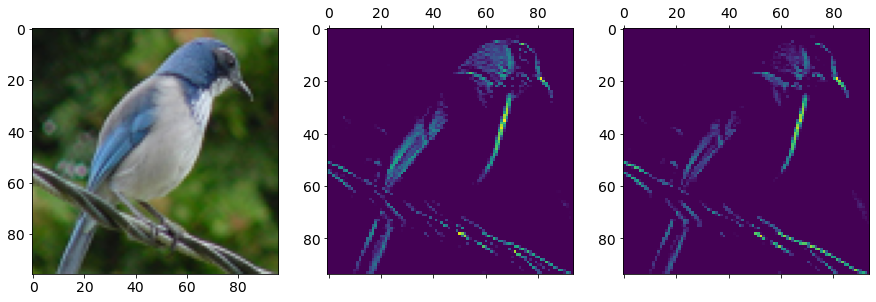

_________________________________________________________________________________________________________

Layer 0 activations,  channel  29

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    52.108532
It's coordinates on the picture as (y, x):  (22, 66)


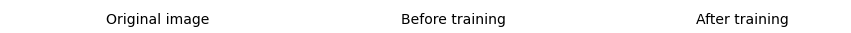

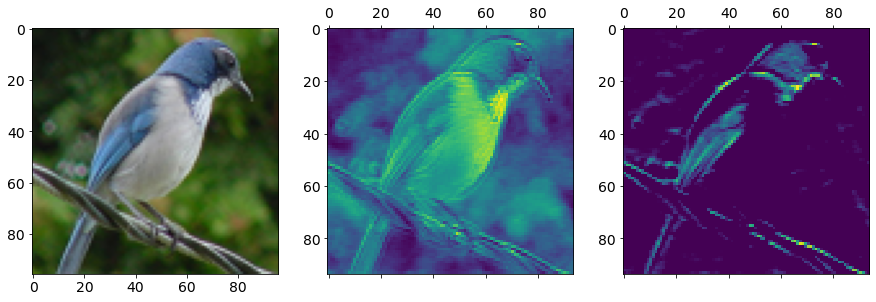

_________________________________________________________________________________________________________

Layer 0 activations,  channel  30

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    8.411885
It's coordinates on the picture as (y, x):  (0, 55)


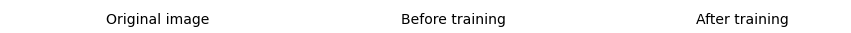

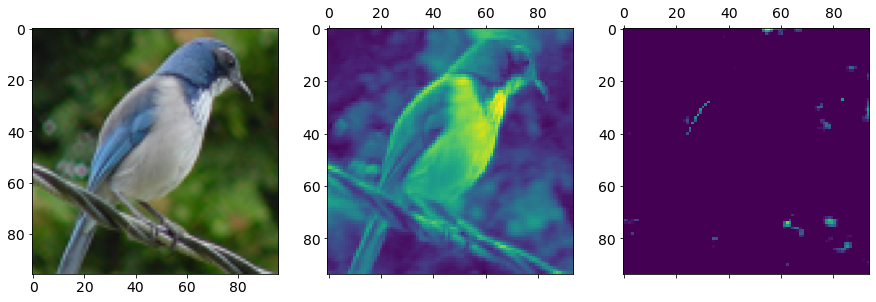

_________________________________________________________________________________________________________


In [16]:
del(model)
model_0 = keras.models.load_model('./Models/model_0.h5')
model = keras.models.load_model('./Models/model_0_8-30-8-adlt-trd.h5') # No.14

layers_range = 8
layer = 0
chanels_range = [0, 31]  # all chanels

my_functions.activations_preview(layer, model_0, model, layers_range, img_tensor, chanels_range)

### 5. An example of activating the other convolutional layer  - No. 14

_________________________________________________________________________________________________________

Layer 2 activations,  channel  48

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 10)

Max. value of activation after training:    103.93436
It's coordinates on the picture as (y, x):  (24, 10)


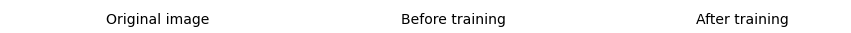

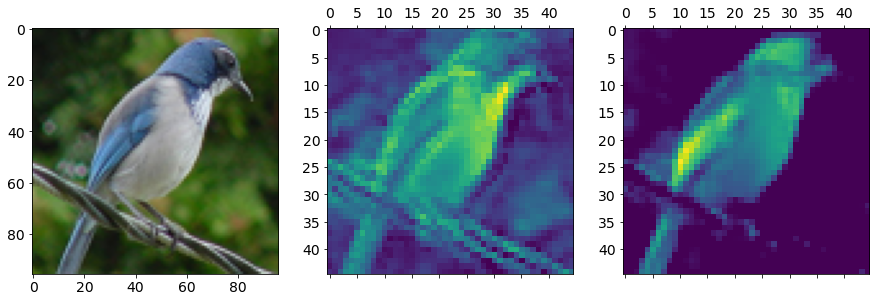

_________________________________________________________________________________________________________

Layer 2 activations,  channel  49

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 1)

Max. value of activation after training:    63.95589
It's coordinates on the picture as (y, x):  (1, 30)


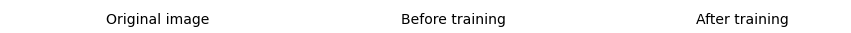

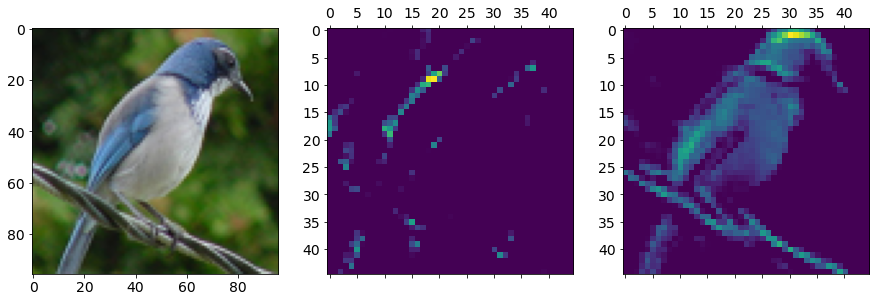

_________________________________________________________________________________________________________

Layer 2 activations,  channel  50

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    4.8118157
It's coordinates on the picture as (y, x):  (43, 27)


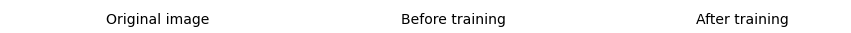

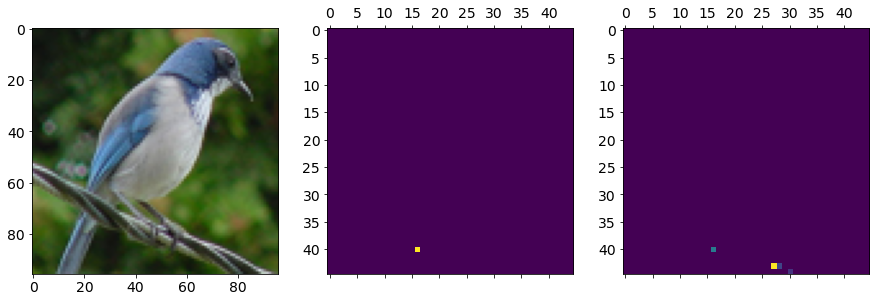

_________________________________________________________________________________________________________

Layer 2 activations,  channel  51

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 2)

Max. value of activation after training:    52.965954
It's coordinates on the picture as (y, x):  (0, 30)


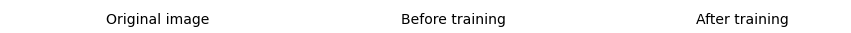

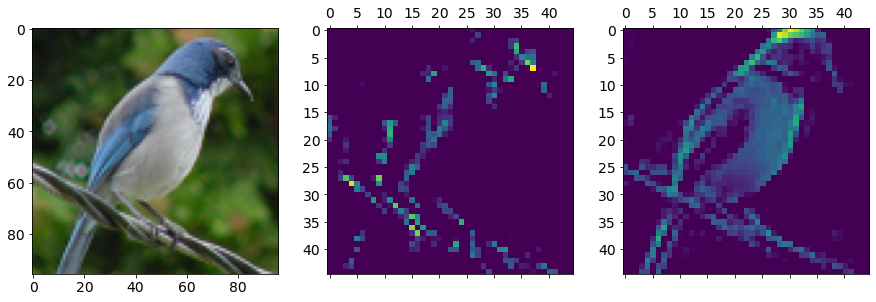

_________________________________________________________________________________________________________

Layer 2 activations,  channel  52

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    60.14608
It's coordinates on the picture as (y, x):  (7, 25)


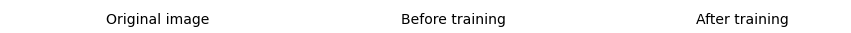

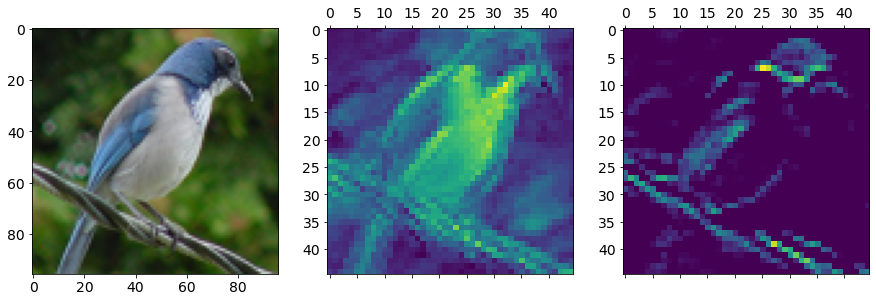

_________________________________________________________________________________________________________

Layer 2 activations,  channel  53

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    20.08474
It's coordinates on the picture as (y, x):  (10, 18)


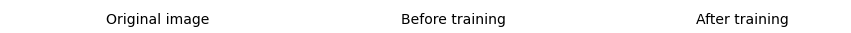

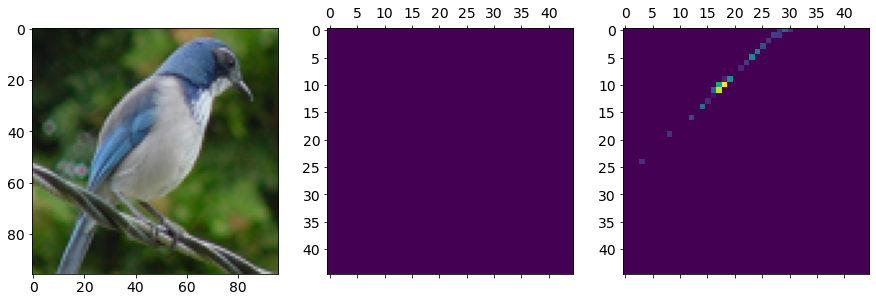

_________________________________________________________________________________________________________

Layer 2 activations,  channel  54

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    24.932337
It's coordinates on the picture as (y, x):  (1, 37)


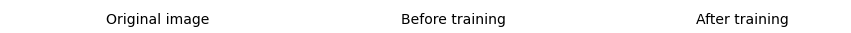

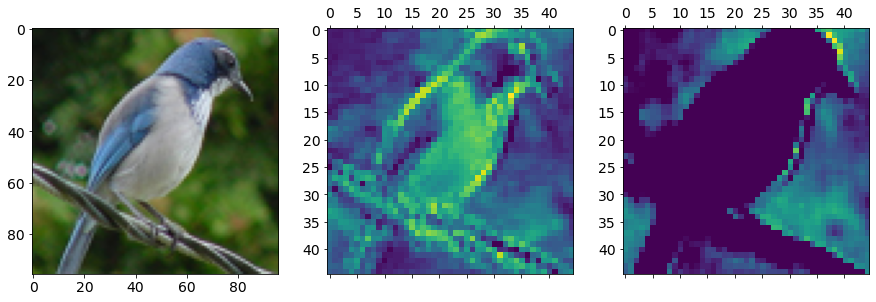

_________________________________________________________________________________________________________

Layer 2 activations,  channel  55

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 2)

Max. value of activation after training:    42.375244
It's coordinates on the picture as (y, x):  (5, 23)


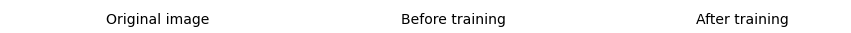

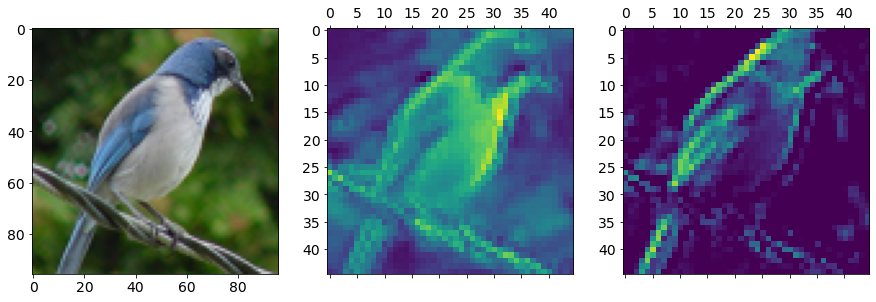

_________________________________________________________________________________________________________

Layer 2 activations,  channel  56

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 29)

Max. value of activation after training:    38.70707
It's coordinates on the picture as (y, x):  (19, 29)


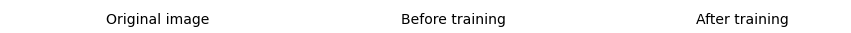

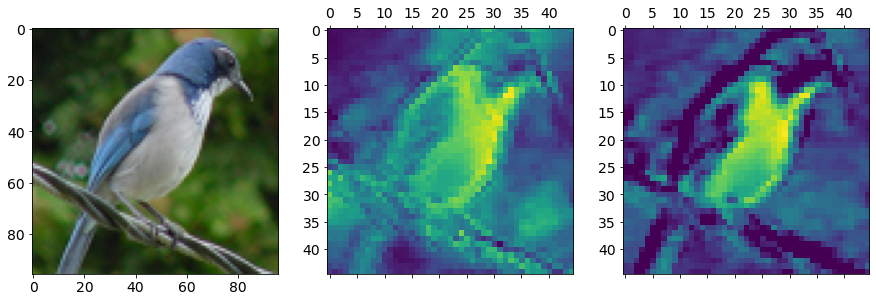

_________________________________________________________________________________________________________

Layer 2 activations,  channel  57

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    61.749104
It's coordinates on the picture as (y, x):  (39, 33)


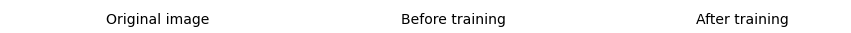

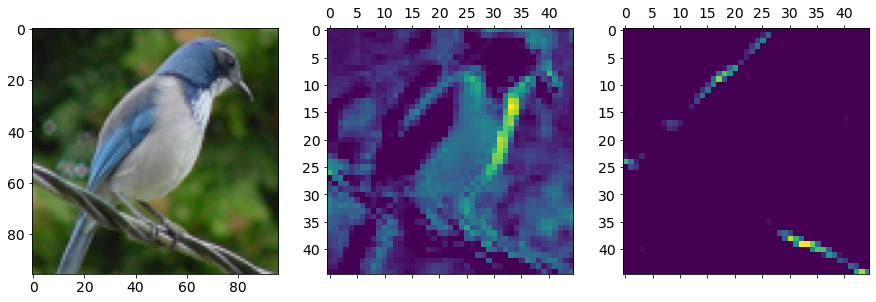

_________________________________________________________________________________________________________

Layer 2 activations,  channel  58

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 25)

Max. value of activation after training:    85.78774
It's coordinates on the picture as (y, x):  (40, 31)


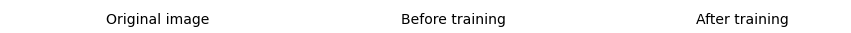

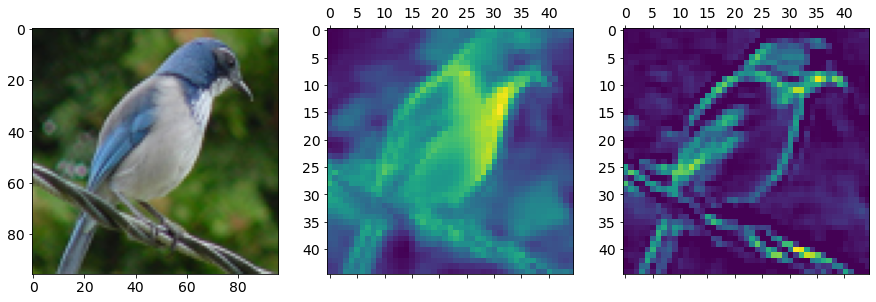

_________________________________________________________________________________________________________

Layer 2 activations,  channel  59

Min. value of activation after training:    0.0
It's coordinates on the picture as (y, x):  (0, 0)

Max. value of activation after training:    59.337135
It's coordinates on the picture as (y, x):  (23, 10)


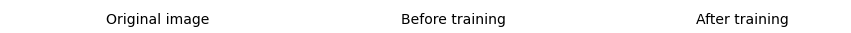

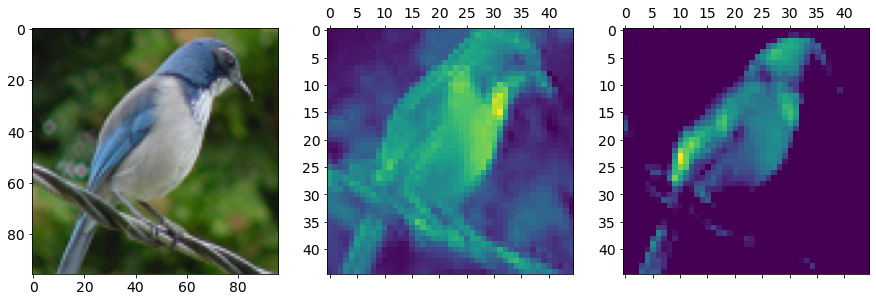

_________________________________________________________________________________________________________


In [17]:
del(model)
model_0 = keras.models.load_model('./Models/model_0.h5')
model = keras.models.load_model('./Models/model_0_8-30-8-adlt-trd.h5') # No.14

layers_range = 8
layer = 2
chanels_range = [48, 60]  # chanels 48-60

my_functions.activations_preview(layer, model_0, model, layers_range, img_tensor, chanels_range)